<a href="https://colab.research.google.com/github/adityabalu/ssl-nov-2024/blob/main/SSL_M2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Self-Supervised Learning with SimCLR using Pytorch-Lightning and Lightly

Source : https://uvadlc-notebooks.readthedocs.io/en/latest/tutorial_notebooks/JAX/tutorial17/SimCLR.html  
by Phillip Lippe

##Types of SSL

1.   Contrastive self-supervised learning


*   Contrastive learning methods use
both types of data i.e., positive and negative data. There are two main functions of this learning
*   To reduce the distance between positive data to minimum
*   To increase the distance between negative data to maximum


2.   Non-contrastive self-supervised learning
*   Non-contrastive learning methods use only positive data. This learning congregates on a useful local minimum. It doesn’t focus on reaching the expected identity function with zero loss


SimCLR is a type of contrastive learning algorithm which focuses on how images are different from each other. They learn to cluster an image and its slightly augmented version in latent space, while the distance to other images are maximized.

The paper for SimCLR : https://arxiv.org/abs/2006.10029


##Importing and installation
We first import the necessary packages and install pytorch-lightning which is the primary package we use to implement SimCLR

In [ ]:
## Standard libraries
import os
from copy import deepcopy

## Imports for plotting
import cv2
from PIL import Image
import matplotlib.pyplot as plt
plt.set_cmap('cividis')
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('svg', 'pdf') # For export
import matplotlib
matplotlib.rcParams['lines.linewidth'] = 2.0
import seaborn as sns
sns.set()

#plotting nearest neighbors
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import normalize
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

## tqdm for loading bars
from tqdm.notebook import tqdm

## PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as data
import torch.optim as optim

## Torchvision
import torchvision
from torchvision.datasets import STL10
from torchvision import transforms

# PyTorch Lightning
try:
    import pytorch_lightning as pl
except ModuleNotFoundError: # Google Colab does not have PyTorch Lightning installed by default. Hence, we do it here if necessary
    !pip install --quiet pytorch-lightning>=1.4
    import pytorch_lightning as pl
from pytorch_lightning.callbacks import LearningRateMonitor, ModelCheckpoint

# Import tensorboard
%load_ext tensorboard

# Path to the folder where the datasets are/should be downloaded (e.g. CIFAR10)
DATASET_PATH = "../data"
# Path to the folder where the pretrained models are saved
CHECKPOINT_PATH = "../saved_models/adlrg_ssl_tutorial"
# In this notebook, we use data loaders with heavier computational processing. It is recommended to use as many
# workers as possible in a data loader, which corresponds to the number of CPU cores
NUM_WORKERS = os.cpu_count()

# Setting the seed
pl.seed_everything(42)

# Ensure that all operations are deterministic on GPU (if used) for reproducibility
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")
print("Device:", device)
print("Number of workers:", NUM_WORKERS)

<ipython-input-1-c736454f4d10>:12: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('svg', 'pdf') # For export
INFO:lightning_fabric.utilities.seed:Seed set to 42


Device: cuda:0
Number of workers: 2


<Figure size 640x480 with 0 Axes>

We download the pretrained models from the original author to skip training process during our tutorial

In [ ]:
import urllib.request
from urllib.error import HTTPError
# Github URL where saved models are stored for this tutorial
base_url = "https://raw.githubusercontent.com/phlippe/saved_models/main/tutorial17/"
# Files to download
pretrained_files = ["SimCLR.ckpt", "ResNet.ckpt",
                    "tensorboards/SimCLR/events.out.tfevents.SimCLR",
                    "tensorboards/classification/ResNet/events.out.tfevents.ResNet"]
pretrained_files += [f"LogisticRegression_{size}.ckpt" for size in [10, 20, 50, 100, 200, 500]]
# Create checkpoint path if it doesn't exist yet
os.makedirs(CHECKPOINT_PATH, exist_ok=True)

# For each file, check whether it already exists. If not, try downloading it.
for file_name in pretrained_files:
    file_path = os.path.join(CHECKPOINT_PATH, file_name)
    if "/" in file_name:
        os.makedirs(file_path.rsplit("/",1)[0], exist_ok=True)
    if not os.path.isfile(file_path):
        file_url = base_url + file_name
        print(f"Downloading {file_url}...")
        try:
            urllib.request.urlretrieve(file_url, file_path)
        except HTTPError as e:
            print("Something went wrong. Please try to download the file from the GDrive folder, or contact the author with the full output including the following error:\n", e)

## Part 1: Data Augmentation
We obtain 2 different random augmentations for each image in a batch (from the original paper). We could always sample more than two augmentations per image and see how that affects our model. The types of augmentation we choose to deploy on the images play an important role in how the model learns to cluster from the varying latent spaces. In this image you can see a few examples fo different types of augmentations adopted by the original author.  

<center width="100%"><img src="https://github.com/phlippe/uvadlc_notebooks/blob/master/docs/tutorial_notebooks/tutorial17/simclr_data_augmentations.png?raw=1" width="800px" style="padding-top: 10px; padding-bottom: 10px"></center>

Two augmentations when used together that provided good performance as explored by Ting Chen et al: crop-and-resize, and color distortion.

Overall, for our experiments, we apply a set of 5 transformations following the original SimCLR setup: random horizontal flip, crop-and-resize, color distortion, random grayscale, and gaussian blur.

In [ ]:
class ContrastiveTransformations(object):
    def __init__(self, base_transforms, n_views=2):
        self.base_transforms = base_transforms
        self.n_views = n_views

    def __call__(self, x):
        return [self.base_transforms(x) for i in range(self.n_views)]

In [ ]:
contrast_transforms = transforms.Compose([transforms.RandomHorizontalFlip(),
                                          transforms.RandomResizedCrop(size=96),
                                          transforms.RandomApply([
                                          transforms.ColorJitter(brightness=0.5,
                                                                     contrast=0.5,
                                                                     saturation=0.5,
                                                                     hue=0.1)
                                          ], p=0.8),
                                          transforms.RandomGrayscale(p=0.2),
                                          transforms.GaussianBlur(kernel_size=9),
                                          transforms.ToTensor(),
                                          transforms.Normalize((0.5,), (0.5,))
                                         ])

The dataset we will use in this tutorial would be the STL10 (https://cs.stanford.edu/~acoates/stl10/), which contains images of 10 classes with 500 labelled images per class. We use torchvision's module to download labelled and unlabelled STL10 dataset.

100%|██████████| 2.64G/2.64G [01:39<00:00, 26.5MB/s]


Extracting ../data/stl10_binary.tar.gz to ../data


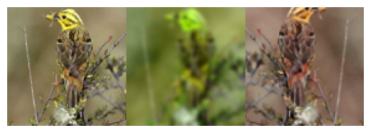

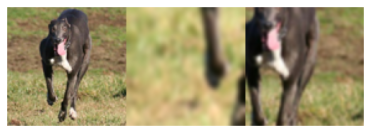

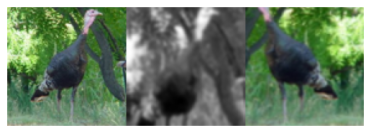

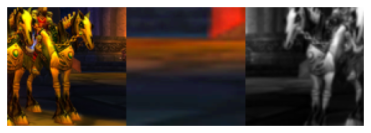

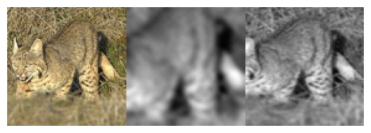

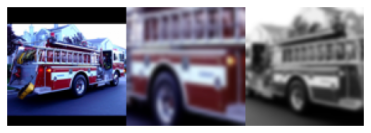

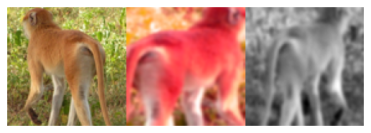

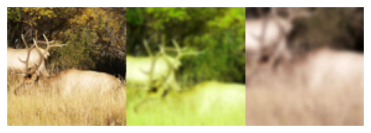

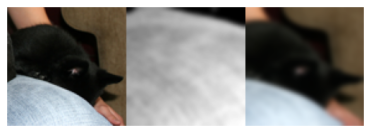

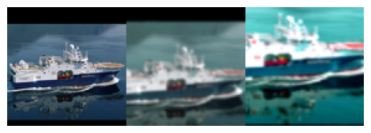

In [ ]:
normal_transforms = transforms.Compose([transforms.ToTensor(),
                                          transforms.Normalize((0.5,), (0.5,))
                                         ])
def normalize(img):
  img= (img-np.min(img))/(np.max(img)-np.min(img))
  return img
untrans_data = STL10(root=DATASET_PATH, split='train', download=True,)
c=0
for i,_ in untrans_data:
  if(c<10):
    t=[]
    t.append(normalize(i))
    for j in range(0,2):
      transformed=contrast_transforms(i)
      transformed=transformed.permute(1, 2, 0).numpy()
      t.append( normalize(transformed))
    final_img=np.hstack(t)
    plt.imshow(final_img)
    plt.axis('off')
    plt.show()
    c+=1

In [ ]:
unlabeled_data = STL10(root=DATASET_PATH, split='unlabeled', download=True,
                       transform=ContrastiveTransformations(contrast_transforms, n_views=2))
train_data_contrast = STL10(root=DATASET_PATH, split='train', download=True,
                            transform=ContrastiveTransformations(contrast_transforms, n_views=2))

Files already downloaded and verified
Files already downloaded and verified


We verify if our data transformations have been applied correctly by plotting some example image pairs

INFO:lightning_fabric.utilities.seed:Seed set to 42


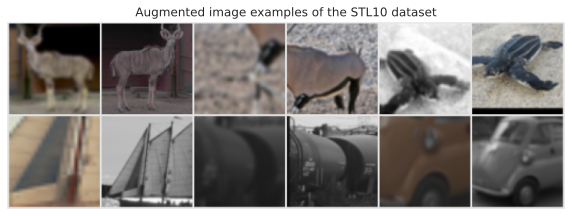

In [ ]:
# Visualize some examples
pl.seed_everything(42)
NUM_IMAGES = 6
imgs = torch.stack([img for idx in range(NUM_IMAGES) for img in unlabeled_data[idx][0]], dim=0)
img_grid = torchvision.utils.make_grid(imgs, nrow=6, normalize=True, pad_value=0.9)
img_grid = img_grid.permute(1, 2, 0)

plt.figure(figsize=(10,5))
plt.title('Augmented image examples of the STL10 dataset')
plt.imshow(img_grid)
plt.axis('off')
plt.show()
plt.close()

### Part 2: Implementing SimCLR's contrastive loss function

We obtain two augmented versions of each image in every iteration.
Both of these images are encoded into a one-dimensional feature vector, between which we want to maximize similarity which minimizes it to all other images in the batch. The encoder we use in this tutorial is ResNet-18. The projection head in our network maps the representation into a space where we compare similarities between vectors. Refer to the paper for more information about the implementation of the contrastive loss function.




In [ ]:
class SimCLR(pl.LightningModule):

    def __init__(self, hidden_dim, lr, temperature, weight_decay, max_epochs=500):
        super().__init__()
        self.save_hyperparameters()
        assert self.hparams.temperature > 0.0, 'The temperature must be a positive float!'
        # Base model f(.)
        self.convnet = torchvision.models.resnet18(num_classes=4*hidden_dim)  # Output of last linear layer
        # The MLP for g(.) consists of Linear->ReLU->Linear
        self.convnet.fc = nn.Sequential(
            self.convnet.fc,  # Linear(ResNet output, 4*hidden_dim)
            nn.ReLU(inplace=True),
            nn.Linear(4*hidden_dim, hidden_dim)
        )

    def configure_optimizers(self):
        optimizer = optim.AdamW(self.parameters(),
                                lr=self.hparams.lr,
                                weight_decay=self.hparams.weight_decay)
        lr_scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer,
                                                            T_max=self.hparams.max_epochs,
                                                            eta_min=self.hparams.lr/50)
        return [optimizer], [lr_scheduler]

    def info_nce_loss(self, batch, mode='train'):
        imgs, _ = batch
        imgs = torch.cat(imgs, dim=0)

        # Encode all images
        feats = self.convnet(imgs)
        # Calculate cosine similarity
        cos_sim = F.cosine_similarity(feats[:,None,:], feats[None,:,:], dim=-1)
        # Mask out cosine similarity to itself
        self_mask = torch.eye(cos_sim.shape[0], dtype=torch.bool, device=cos_sim.device)
        cos_sim.masked_fill_(self_mask, -9e15)
        # Find positive example -> batch_size//2 away from the original example
        pos_mask = self_mask.roll(shifts=cos_sim.shape[0]//2, dims=0)
        # InfoNCE loss
        cos_sim = cos_sim / self.hparams.temperature
        nll = -cos_sim[pos_mask] + torch.logsumexp(cos_sim, dim=-1)
        nll = nll.mean()

        # Logging loss
        self.log(mode+'_loss', nll)
        # Get ranking position of positive example
        comb_sim = torch.cat([cos_sim[pos_mask][:,None],  # First position positive example
                              cos_sim.masked_fill(pos_mask, -9e15)],
                             dim=-1)
        sim_argsort = comb_sim.argsort(dim=-1, descending=True).argmin(dim=-1)
        # Logging ranking metrics
        self.log(mode+'_acc_top1', (sim_argsort == 0).float().mean())
        self.log(mode+'_acc_top5', (sim_argsort < 5).float().mean())
        self.log(mode+'_acc_mean_pos', 1+sim_argsort.float().mean())

        return nll

    def training_step(self, batch, batch_idx):
        return self.info_nce_loss(batch, mode='train')

    def validation_step(self, batch, batch_idx):
        self.info_nce_loss(batch, mode='val')

### Part 3: Training

Now that we have implemented SimCLR and the data loading pipeline, we are ready to train the model.

In [ ]:
def train_simclr(batch_size, max_epochs=500, **kwargs):
    trainer = pl.Trainer(default_root_dir=os.path.join(CHECKPOINT_PATH, 'SimCLR'),
                         accelerator="gpu" if str(device).startswith("cuda") else "cpu",
                         devices=1,
                         max_epochs=max_epochs,
                         callbacks=[ModelCheckpoint(save_weights_only=True, mode='max', monitor='val_acc_top5'),
                                    LearningRateMonitor('epoch')])
    trainer.logger._default_hp_metric = None # Optional logging argument that we don't need

    # Check whether pretrained model exists. If yes, load it and skip training
    pretrained_filename = os.path.join(CHECKPOINT_PATH, 'SimCLR.ckpt')
    if os.path.isfile(pretrained_filename):
        print(f'Found pretrained model at {pretrained_filename}, loading...')
        model = SimCLR.load_from_checkpoint(pretrained_filename) # Automatically loads the model with the saved hyperparameters
    else:
        train_loader = data.DataLoader(unlabeled_data, batch_size=batch_size, shuffle=True,
                                       drop_last=True, pin_memory=True, num_workers=NUM_WORKERS)
        val_loader = data.DataLoader(train_data_contrast, batch_size=batch_size, shuffle=False,
                                     drop_last=False, pin_memory=True, num_workers=NUM_WORKERS)
        pl.seed_everything(42) # To be reproducable
        model = SimCLR(max_epochs=max_epochs, **kwargs)
        trainer.fit(model, train_loader, val_loader)
        model = SimCLR.load_from_checkpoint(trainer.checkpoint_callback.best_model_path) # Load best checkpoint after training

    return model

We can experiment with various hyperparameter settings here. Here we call the train_simclr function to train the model. To save time during this tutorial, we skip training and load the pretrained model.

In [ ]:
simclr_model = train_simclr(batch_size=256,
                            hidden_dim=128,
                            lr=5e-4,
                            temperature=0.07,
                            weight_decay=1e-4,
                            max_epochs=500)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Found pretrained model at ../saved_models/adlrg_ssl_tutorial/SimCLR.ckpt, loading...


INFO:pytorch_lightning.utilities.migration.utils:Lightning automatically upgraded your loaded checkpoint from v1.3.4 to v2.4.0. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint ../saved_models/adlrg_ssl_tutorial/SimCLR.ckpt`


To get an intuition of how training with contrastive learning behaves, we can take a look at the TensorBoard below:

In [ ]:
%tensorboard --logdir ../saved_models/adlrg_ssl_tutorial/tensorboards/SimCLR/

Reusing TensorBoard on port 6006 (pid 3039), started 0:03:47 ago. (Use '!kill 3039' to kill it.)

<IPython.core.display.Javascript object>

##Part 4: Visual inspection of embeddings

We want to check how good these embeddings are, visually. In order to do so, we obtain embeddings using the SSL pretrained backbone encoder of images belonging to training set. We also acquire the embedding of a query image we are interested in. If the backbone has learnt useful features, it would have obtained neighbors that are closest in its embedded space to the query image, e.g, if a cat image was given, other cat images belonging to the training set should have been picked as its closest neighbors

In [ ]:
#Define function to get embeddings for training set
@torch.no_grad()
def get_embeddings(model, dataset):
    # Prepare model
    network = deepcopy(model.convnet)
    network.fc = nn.Identity()  # Removing projection head g(.)
    network.eval()
    network.to(device)

    # Encode all images
    data_loader = data.DataLoader(dataset, batch_size=64, num_workers=NUM_WORKERS, shuffle=False, drop_last=False)
    feats, labels = [], []
    for batch_imgs,_ in tqdm(data_loader):
        batch_imgs = batch_imgs.to(device)
        batch_feats = network(batch_imgs)
        feats.append(batch_feats.detach().cpu())
    feats = torch.cat(feats, dim=0)
    return feats
#Define function to get embedding of the query image
@torch.no_grad()
def prepare_query(model,query_img_path):
  # Prepare model
    network = deepcopy(model.convnet)
    network.fc = nn.Identity()  # Removing projection head g(.)
    network.eval()
    network.to(device)
    img=cv2.imread(query_img_path)
    img=img_transforms(img).unsqueeze(0)
    img = img.to(device)
    feats = network(img)
    return feats

In [ ]:
#Function to obtain 3-closest neighbors of query embedding
def get_kneighbors(query_embedding,train_embedding):
  # Generate random embeddings as placeholders for demonstration (replace with your actual embeddings)
  num_embeddings = 5000
  embedding_size = 512  # Adjust this to match your actual embedding size

  # Compute cosine similarity between the query embedding and all other embeddings
  similarities = cosine_similarity(query_embedding, train_embedding)

  # Find the indices of the top 3 closest neighbors
  num_neighbors = 3
  nearest_indices = np.argsort(similarities[0])[-num_neighbors:][::-1]

  # Obtain indices of its nearest neighbors
  n_index=[]
  for i, neighbor_index in enumerate(nearest_indices):
      neighbor_embedding = train_embedding[neighbor_index]
      n_index.append(neighbor_index)
  return n_index

In [ ]:
#Apply transforms and obtain training set embeddings
img_transforms = transforms.Compose([transforms.ToTensor(),
                                        transforms.Normalize((0.5,), (0.5,))])
train_img_data = STL10(root=DATASET_PATH, split='train', download=True,
                       transform=img_transforms)
train_embedding=get_embeddings(simclr_model, train_img_data)

Files already downloaded and verified


  0%|          | 0/79 [00:00<?, ?it/s]

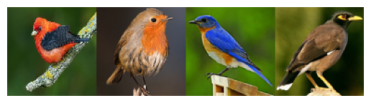

In [ ]:
#Provide path to query image to which the closest neighbors have to be found
query_img_path='/content/birds.jpg'
query_embedding=prepare_query(simclr_model,query_img_path)
n_index=get_kneighbors(query_embedding.cpu(),train_embedding.cpu())
imgs=[]
img=cv2.imread(query_img_path)
img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
img=cv2.resize(img,(96,96))
img = (img-np.min(img))/(np.max(img)-np.min(img))
imgs.append(img)
for c in n_index:
    img,_=train_img_data[c]
    img=img.permute(1, 2, 0).numpy()
    img = (img-np.min(img))/(np.max(img)-np.min(img))
    imgs.append(img)
stacked_image = np.hstack((imgs))
plt.imshow(stacked_image)
plt.axis('off')
plt.show()

We can see that the image on the left hand side is the query image, the three images on the right were its closests neighbors (in its latent space). STL10 dataset contains a class of birds and the trained network has appropriately picked images that look similar to birds, i.e images of other birds.

## Part 5: Downstream task (Classification on labelled data)

After we have trained our model via contrastive learning, we can deploy it on downstream tasks and see how well it performs with little data.

We implement a simple classifier.

In [ ]:
class SimpleClassifier(pl.LightningModule):

    def __init__(self, feature_dim, num_classes, lr, weight_decay, max_epochs=100):
        super().__init__()
        self.save_hyperparameters()
        # Mapping from representation h to classes
        self.model = nn.Linear(feature_dim, num_classes)

    def configure_optimizers(self):
        optimizer = optim.AdamW(self.parameters(),
                                lr=self.hparams.lr,
                                weight_decay=self.hparams.weight_decay)
        lr_scheduler = optim.lr_scheduler.MultiStepLR(optimizer,
                                                      milestones=[int(self.hparams.max_epochs*0.6),
                                                                  int(self.hparams.max_epochs*0.8)],
                                                      gamma=0.1)
        return [optimizer], [lr_scheduler]

    def _calculate_loss(self, batch, mode='train'):
        feats, labels = batch
        preds = self.model(feats)
        loss = F.cross_entropy(preds, labels)
        acc = (preds.argmax(dim=-1) == labels).float().mean()

        self.log(mode + '_loss', loss)
        self.log(mode + '_acc', acc)
        return loss

    def training_step(self, batch, batch_idx):
        return self._calculate_loss(batch, mode='train')

    def validation_step(self, batch, batch_idx):
        self._calculate_loss(batch, mode='val')

    def test_step(self, batch, batch_idx):
        self._calculate_loss(batch, mode='test')

The data we use is the training and test set of STL10. The training contains 500 images per class, while the test set has 800 images per class.

In [ ]:
img_transforms = transforms.Compose([transforms.ToTensor(),
                                     transforms.Normalize((0.5,), (0.5,))])

train_img_data = STL10(root=DATASET_PATH, split='train', download=True,
                       transform=img_transforms)
test_img_data = STL10(root=DATASET_PATH, split='test', download=True,
                      transform=img_transforms)

print("Number of training examples:", len(train_img_data))
print("Number of test examples:", len(test_img_data))

Files already downloaded and verified
Files already downloaded and verified
Number of training examples: 5000
Number of test examples: 8000


We write a function to get a feature vector of an image that is obtained by passing through the self-supervised pretrained backbone  

In [ ]:
@torch.no_grad()
def prepare_data_features(model, dataset):
    # Prepare model
    network = deepcopy(model.convnet)
    network.fc = nn.Identity()  # Removing projection head g(.)
    network.eval()
    network.to(device)

    # Encode all images
    data_loader = data.DataLoader(dataset, batch_size=64, num_workers=NUM_WORKERS, shuffle=False, drop_last=False)
    feats, labels = [], []
    for batch_imgs, batch_labels in tqdm(data_loader):
        batch_imgs = batch_imgs.to(device)
        batch_feats = network(batch_imgs)
        feats.append(batch_feats.detach().cpu())
        labels.append(batch_labels)

    feats = torch.cat(feats, dim=0)
    labels = torch.cat(labels, dim=0)

    # Sort images by labels
    labels, idxs = labels.sort()
    feats = feats[idxs]

    return data.TensorDataset(feats, labels)

We obtain the feature vectors of the training and test images

In [ ]:
train_feats_simclr = prepare_data_features(simclr_model, train_img_data)
test_feats_simclr = prepare_data_features(simclr_model, test_img_data)

  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/125 [00:00<?, ?it/s]

We write a function for training the classifier model where we define our Trainer, create our data loaders and save our accuracy results. Again, we have a pretrained classifier to save time during our session but you are always free to train yours.

In [ ]:
def train_classifier(batch_size, train_feats_data, test_feats_data, model_suffix, max_epochs=100, **kwargs):
    trainer = pl.Trainer(default_root_dir=os.path.join(CHECKPOINT_PATH, "LogisticRegression"),
                         accelerator="gpu" if str(device).startswith("cuda") else "cpu",
                         devices=1,
                         max_epochs=max_epochs,
                         callbacks=[ModelCheckpoint(save_weights_only=True, mode='max', monitor='val_acc'),
                                    LearningRateMonitor("epoch")],
                         enable_progress_bar=False,
                         check_val_every_n_epoch=10)
    trainer.logger._default_hp_metric = None

    # Data loaders
    train_loader = data.DataLoader(train_feats_data, batch_size=batch_size, shuffle=True,
                                   drop_last=False, pin_memory=True, num_workers=0)
    test_loader = data.DataLoader(test_feats_data, batch_size=batch_size, shuffle=False,
                                  drop_last=False, pin_memory=True, num_workers=0)

    # Check whether pretrained model exists. If yes, load it and skip training
    pretrained_filename = os.path.join(CHECKPOINT_PATH, f"LogisticRegression_{model_suffix}.ckpt")
    if os.path.isfile(pretrained_filename):
        print(f"Found pretrained model at {pretrained_filename}, loading...")
        model = SimpleClassifier.load_from_checkpoint(pretrained_filename)
    else:
        pl.seed_everything(42)  # To be reproducable
        model = SimpleClassifier(**kwargs)
        trainer.fit(model, train_loader, test_loader)
        model = SimpleClassifier.load_from_checkpoint(trainer.checkpoint_callback.best_model_path)

    # Test best model on train and validation set
    train_result = trainer.test(model, train_loader, verbose=False)
    test_result = trainer.test(model, test_loader, verbose=False)
    result = {"train": train_result[0]["test_acc"], "test": test_result[0]["test_acc"]}

    return model, result

We would like to see how increasing number of labelled samples increase our classification accuracy on our test dataset. Here we create a small function to get subsets of the dataset for the same purpose.

In [ ]:
 def get_smaller_dataset(original_dataset, num_imgs_per_label):
    new_dataset = data.TensorDataset(
         *[t.unflatten(0, (10, -1))[:,:num_imgs_per_label].flatten(0, 1) for t in original_dataset.tensors]
    )
    return new_dataset

We obtain 6 dataset subsets, each with varying number of labelled samples. 6 classifiers are trained on these subsets and we save the respective results.

In [ ]:
results = {}
for num_imgs_per_label in [10, 20, 50, 100, 200, 500]:
    sub_train_set = get_smaller_dataset(train_feats_simclr, num_imgs_per_label)
    _, small_set_results = train_classifier(batch_size=64,
                                        train_feats_data=sub_train_set,
                                        test_feats_data=test_feats_simclr,
                                        model_suffix=num_imgs_per_label,
                                        feature_dim=train_feats_simclr.tensors[0].shape[1],
                                        num_classes=10,
                                        lr=1e-3,
                                        weight_decay=1e-3)
    results[num_imgs_per_label] = small_set_results

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.migration.utils:Lightning automatically upgraded your loaded checkpoint from v1.3.4 to v2.0.8. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file ../saved_models/adlrg_ssl_tutorial/LogisticRegression_10.ckpt`


Found pretrained model at ../saved_models/adlrg_ssl_tutorial/LogisticRegression_10.ckpt, loading...


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:490: PossibleUserWarning: Your `test_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.
  rank_zero_warn(
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.migration.utils:Lightning automatically upgraded your loaded checkpoint from v1.3.4 to v2.0.8. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpo

Found pretrained model at ../saved_models/adlrg_ssl_tutorial/LogisticRegression_20.ckpt, loading...


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.migration.utils:Lightning automatically upgraded your loaded checkpoint from v1.3.4 to v2.0.8. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file ../saved_models/adlrg_ssl_tutorial/LogisticRegression_50.ckpt`
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Found pretrained model at ../saved_models/adlrg_ssl_tutorial/LogisticRegression_50.ckpt, loading...


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.migration.utils:Lightning automatically upgraded your loaded checkpoint from v1.3.4 to v2.0.8. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file ../saved_models/adlrg_ssl_tutorial/LogisticRegression_100.ckpt`
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Found pretrained model at ../saved_models/adlrg_ssl_tutorial/LogisticRegression_100.ckpt, loading...


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.migration.utils:Lightning automatically upgraded your loaded checkpoint from v1.3.4 to v2.0.8. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file ../saved_models/adlrg_ssl_tutorial/LogisticRegression_200.ckpt`
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Found pretrained model at ../saved_models/adlrg_ssl_tutorial/LogisticRegression_200.ckpt, loading...


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.migration.utils:Lightning automatically upgraded your loaded checkpoint from v1.3.4 to v2.0.8. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file ../saved_models/adlrg_ssl_tutorial/LogisticRegression_500.ckpt`
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Found pretrained model at ../saved_models/adlrg_ssl_tutorial/LogisticRegression_500.ckpt, loading...


We visualize the accracy scores for varying labelled data subsets

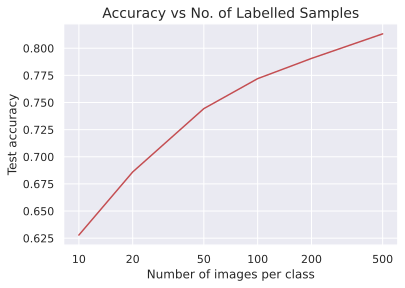

Test accuracy for  10 images per label: 62.79%
Test accuracy for  20 images per label: 68.60%
Test accuracy for  50 images per label: 74.44%
Test accuracy for 100 images per label: 77.20%
Test accuracy for 200 images per label: 79.06%
Test accuracy for 500 images per label: 81.33%


In [ ]:
dataset_sizes = sorted([k for k in results])
test_scores = [results[k]["test"] for k in dataset_sizes]

fig = plt.figure(figsize=(6,4))
plt.plot(dataset_sizes, test_scores, '-', color="r", marker="", markeredgecolor="g", markerfacecolor="g", markersize=16)
plt.xscale("log")
plt.xticks(dataset_sizes, labels=dataset_sizes)
plt.title("Accuracy vs No. of Labelled Samples", fontsize=14)
plt.xlabel("Number of images per class")
plt.ylabel("Test accuracy")
plt.minorticks_off()
plt.show()

for k, score in zip(dataset_sizes, test_scores):
    print(f'Test accuracy for {k:3d} images per label: {100*score:4.2f}%')

With increasing number of labelled samples, our classification accuracy increases as well. When we use 40% of labels, we get ~79% which is very comparable to the accuracy when 100% of the labels are used. The baseline classifier model which was trained from scratch (initialized from random weights) gave the following results: Train accuracy of 99.76% and test accuracy of 73.31% and this accuracy can be achieved with just 10% of the labels when he backbone encoder was pretrained with SimCLR.

#Simplified coding using Lightly

##Installation

In [ ]:
!pip install lightly

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 660.5/660.5 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 11.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.6/137.6 kB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 11.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 14.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.9.3-py3-none-any.whl size=144554 sha256=1da8c73b888891c5e02364de9ce67a558d7a644da98a33acdf998e9586353395
  Stored in directory: /root/.cache/pip/wheels/12/93/dd/1f6a127edc45659556564c5730f6d4e300888f4bca2d4c5a88
Successfully built antlr4-python3-runtime


Importing necessary packages

In [ ]:
import torch
import torchvision
from torch import nn
from lightly.loss import NTXentLoss
from lightly.models.modules import SimCLRProjectionHead
from lightly.transforms.simclr_transform import SimCLRTransform


Define SimCLR and train the model

In [ ]:
#Define SimCLR class defining backbone and projection head
class SimCLR(nn.Module):
    def __init__(self, backbone):
        super().__init__()
        self.backbone = backbone
        self.projection_head = SimCLRProjectionHead(512, 512, 128)

    def forward(self, x):
        x = self.backbone(x).flatten(start_dim=1)
        z = self.projection_head(x)
        return z

#Define backbone encoder
resnet = torchvision.models.resnet18()
backbone = nn.Sequential(*list(resnet.children())[:-1])
model = SimCLR(backbone)

device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

#Define data augmentations and transforms
transform = SimCLRTransform(input_size=32, gaussian_blur=0.2)

#Create STL10 dataset object
dataset = torchvision.datasets.STL10(
    "dataset/stl10", download=True, transform=transform
)
# or create a dataset from a folder containing images or videos:
# dataset = LightlyDataset("path/to/folder", transform=transform)

#Define dataloader object
dataloader = torch.utils.data.DataLoader(
    dataset,
    batch_size=256,
    shuffle=True,
    drop_last=True,
    num_workers=8,
)

#Define SimCLR's contrastive loss using lightly's in-built function
criterion = NTXentLoss()
#Define optimizer and learning rate
optimizer = torch.optim.SGD(model.parameters(), lr=0.06)

# Training process
print("Starting Training")
for epoch in range(10):
    total_loss = 0
    for batch in dataloader:
        x0, x1 = batch[0]
        x0 = x0.to(device)
        x1 = x1.to(device)
        z0 = model(x0)
        z1 = model(x1)
        loss = criterion(z0, z1)
        total_loss += loss.detach()
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
    avg_loss = total_loss / len(dataloader)
    print(f"epoch: {epoch:>02}, loss: {avg_loss:.5f}")

100%|██████████| 2640397119/2640397119 [01:36<00:00, 27480673.88it/s]


Extracting dataset/stl10/stl10_binary.tar.gz to dataset/stl10
Starting Training


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


epoch: 00, loss: 6.17873
epoch: 01, loss: 6.03717
epoch: 02, loss: 5.97156
epoch: 03, loss: 5.88062
epoch: 04, loss: 5.80858
epoch: 05, loss: 5.76432
epoch: 06, loss: 5.71932
epoch: 07, loss: 5.69013
epoch: 08, loss: 5.67062
epoch: 09, loss: 5.65245


We can see that the loss value decreases steadily. This model could be trained for longer and deployed for a downstream task like how it was demonstrated in the previous section. Lightly simplifies the coding to a great extent and could easily be adapted to other SSL algorithms.

## References


[1] Chen, T., Kornblith, S., Norouzi, M., and Hinton, G. (2020). A simple framework for contrastive learning of visual representations. In International Conference on Machine Learning (ICML 2020). PMLR. ([link](https://arxiv.org/abs/2002.05709))

[2] Lippe, P.,Self-Supervised Contrastive Learning with SimCLR. ([link](https://uvadlc-notebooks.readthedocs.io/en/latest/tutorial_notebooks/tutorial17/SimCLR.html))

[3] SimCLR tutorial using Lightly. ([link](https://docs.lightly.ai/self-supervised-learning/examples/simclr.html))